**MOBOLFI**

The notebook is an implementation of Multi-objective BOLFI on MLBA synthetic data. We firstly construct the MLBA simulator (Hancock et. al., 2022), genearate a "real" data by a set of true parameters. Next, a MOBOLFI model is built and approximate likelihood functions ara defined. Finally, we draw DE-MCMC samples from the approxiamte posteriors, calculated by joint likelihood, marginal likelihood of response time data and marginal likelihood of choice data.

Description of MLBA model is here.

*[Hancock et al, 2021](https://www.sciencedirect.com/science/article/abs/pii/S0191261521000576)*.

As a synthetic data, we consider similar structure to the design of our real world dataset. Consider 320 candidates making decision among 3 alternatives, and each alternative contains 3 attributes. In synthetic data, alternatives and attributes have no explicit semantic meaning for psychology analysis. The data we generate consists of two sources: the candidates resposne time and their final decision made. Each candidate represents an observation, therefore the "real data" has size 320*(3+1), while each row has 1 response time record and 1 response choice record (3 dimensional one-hot encoding).

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import os
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import ConstantKernel, Matern
from scipy.optimize import minimize

In [4]:
# Load response and attributes data
# In synthetic data example we'll only use attributes data for further simulation
df = pd.read_csv("et_choice_resultf5.csv")

**Data Preprocessing**

Following the design of real world data, the 3 alternatives are indexed as "1", "3", "4" respectively, given 3 attributes values for each alternative. The final choice made and fixation trail (response time) of each candidate are recorded. The outcomes from candidates are columns "fixation_trail" and "choice". Fixation_trail is the aggregated time of fixation of response. The choice is the final chosen alternative of the candidate.

In [5]:
# define hyper params
number_of_alternatives = 3
number_of_attributes = 3
number_of_discrepancies = 2 # two data sources, resposne time and choices made


In [6]:
# We select scenarios with letter "A" and "S", these scenarios are designed to learn different psychcology affects.
# Different scenarios give different attributes values to alternatives, we consider all the scenarios for Attraction ("A") affect and Significance ("S") affect
df_data = df[df.Scenario == "A1.1"]
df_data = pd.concat([df_data, df[df.Scenario == "A1.1R"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "A1.2"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "A1.2R"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "A1.3"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "A1.3R"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "A1.4"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "A1.4R"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "S1.1"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "S1.1R"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "S1.2"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "S1.2R"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "S1.3"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "S1.3R"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "S1.4"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "S1.4R"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "S2.1"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "S2.1R"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "S2.2"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "S2.2R"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "S2.3"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "S2.3R"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "S2.4"]],axis=0)
df_data = pd.concat([df_data, df[df.Scenario == "S2.4R"]],axis=0)



# Standardize attributes data
# There are 3 attributes RC OC DR
# Response time column: fixation trail
X_attributes = df_data[["RC","OC","DR"]].astype("float64")
X_attributes[["DR"]] = np.log(X_attributes[["DR"]])

# Feature scaling 
X_attributes = (X_attributes-0)/(X_attributes.max()-0)
# Optional: Reverse the values of attributes for each attribute
# In real data, we reverse some attributes in order to unify the direction of optimization, in synthetic data case it's optional to do this
X_attributes[["RC"]] = 1 - X_attributes[["RC"]]
X_attributes[["OC"]] = 1 - X_attributes[["OC"]]
X_attributes[["DR"]] = 1 - X_attributes[["DR"]]

# Reshape the attribute data
X_attributes = pd.DataFrame(X_attributes.values.reshape(X_attributes.shape[0]//number_of_alternatives, number_of_attributes*number_of_alternatives),
                    columns=['RC1', 'OC1', 'DR1', 'RC3', 'OC3', 'DR3', 'RC4', 'OC4', 'DR4']) # set index by ID and reset_index for a new column



In [7]:
# look up attributes data
X_attributes

,RC1,OC1,DR1,RC3,OC3,DR3,RC4,OC4,DR4
0,0.752066,0.631068,0.086409,0.826446,0.864078,0.161504,0.834711,0.864078,0.221110
1,0.652893,0.650485,0.017315,0.652893,0.805825,0.086409,0.661157,0.805825,0.119212
2,0.752066,0.728155,0.072398,0.702479,0.893204,0.138843,0.710744,0.893204,0.188306
3,0.652893,0.631068,0.008403,0.652893,0.834951,0.086409,0.661157,0.834951,0.119212
4,0.652893,0.572816,0.026803,0.636364,0.834951,0.101898,0.644628,0.834951,0.138843
...,...,...,...,...,...,...,...,...,...
315,0.752066,0.679612,0.059606,0.677686,0.864078,0.138843,0.710744,0.825243,0.138843
316,0.553719,0.757282,0.059606,0.462810,0.893204,0.138843,0.495868,0.854369,0.138843
317,0.256198,0.368932,0.072398,0.033058,0.834951,0.138843,0.066116,0.796117,0.138843
318,0.652893,0.504854,0.036945,0.545455,0.805825,0.119212,0.578512,0.766990,0.119212


In [8]:
# The response data, this data will not be used in this experiment, but the "real data" we use below should have same structure
X_response = df_data[["ID","alt","chosen","fixation_trail"]]
# Change milsecond to second
X_response[["fixation_trail"]] = X_response[["fixation_trail"]]/1000

X_response["chosen1"] = 1*(X_response['chosen']==1)*(X_response["alt"]==1)
X_response["chosen3"] = 1*(X_response['chosen']==1)*(X_response["alt"]==3)
X_response["chosen4"] = 1*(X_response['chosen']==1)*(X_response["alt"]==4)


X_response = X_response.drop(columns=["alt","chosen"])

condition_chosen = X_response[(X_response['chosen1']==0) & (X_response['chosen3']==0) & (X_response['chosen4']==0)].index
X_response = X_response.drop(condition_chosen)

C:\Users\64829\AppData\Local\Temp\ipykernel_7332\160500.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_response[["fixation_trail"]] = X_response[["fixation_trail"]]/1000
C:\Users\64829\AppData\Local\Temp\ipykernel_7332\160500.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_response["chosen1"] = 1*(X_response['chosen']==1)*(X_response["alt"]==1)
C:\Users\64829\AppData\Local\Temp\ipykernel_7332\160500.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

In [9]:
X_response

,ID,fixation_trail,chosen1,chosen3,chosen4
96,111671,12.508,0,1,0
284,11199,18.318,1,0,0
469,111912,6.924,1,0,0
664,112015,6.608,1,0,0
905,112119,18.100,1,0,0
...,...,...,...,...,...
1028,112121,18.924,0,1,0
1205,112224,22.550,0,0,1
1374,112228,107.042,0,0,1
1674,112633,9.398,0,0,1


**MLBA Simulator**

This section reproduces the Hancock MLBA simulator that generates outcomes (fixation_trail, choice) given a set of parameter values and attributes data *[Hancock et al, 2021](https://www.sciencedirect.com/science/article/abs/pii/S0191261521000576)*.

Firstly, we'll define functions to calculate distance and mean drift rate in evidence accumulation process.

In [10]:
def create_distance_matrix(row, number_of_alternatives,number_of_attributes):
    '''
    This function creates a distance matrix, the (i,j)th element of the matrix denotes the values of alternative i substract values of alternative j
    Note that this the matrix is not symmetric, since the substraction is not symmetric.
    row: attributes data in form of a vector with length (number_of_attributes*number_of_alternatives), see layout of X_attributes
    '''
    rows = row.values.reshape(number_of_alternatives,-1)
    distance_matrix = np.zeros((number_of_alternatives,number_of_alternatives,number_of_attributes))
    for i in range(number_of_alternatives):
      for j in range(number_of_alternatives):
        distance_matrix[i,j,:] = rows[i,:]-rows[j,:]

    return distance_matrix

# Test using first row (obs) of the data
create_distance_matrix(X_attributes.iloc[0,:],number_of_alternatives,number_of_attributes)

array([[[ 0.        ,  0.        ,  0.        ],
        [-0.07438017, -0.23300971, -0.07509497],
        [-0.08264463, -0.23300971, -0.1347012 ]],

       [[ 0.07438017,  0.23300971,  0.07509497],
        [ 0.        ,  0.        ,  0.        ],
        [-0.00826446,  0.        , -0.05960623]],

       [[ 0.08264463,  0.23300971,  0.1347012 ],
        [ 0.00826446,  0.        ,  0.05960623],
        [ 0.        ,  0.        ,  0.        ]]])

In [11]:
def compute_mean_drift_rate(X_attributes,lambdas,log_I0,betas,deltas):
    """
    This function is only used in mlba() to compute mean values of drift rate normal distribution
    X_attributes: data of attributes of alternatives
    dis_ij_k = attributes_i - attributes_j for alternative i and j, attribute k for each individual n
    betas: a vector with length of number_of_attributes
    deltas: a vector with length of number_of_alternatives, delta_1 is set to be 0
    lambdas: a length 2 vector, lambda = lambdas[0] if dis_ij is positive, otherwise = lambdas[1]
    log_I0: log of a positive constant that makes the probability of negative drift rates small
    w_n_ij_k = exp(-lambda*betas_k*|dis_ij_k|)
    V_ij = sum(w_ijk*dis_ijk) for k = 1 to number_of_attributes
    d_i = max(0,(delta_j + sum(V_ij) + I)) for j = 1 to number_of_alternatives
    In the function codes below we output d_i for all i for each individual n
    """
    number_of_candidates = int(X_attributes.shape[0])
    means = np.zeros((X_attributes.shape[0], number_of_alternatives))
    lambda0, lambda1 = lambdas[0], lambdas[1]

    for n in range(number_of_candidates):
        attributes_n = X_attributes.iloc[n,:] # attributes of individual n
        distance_matrix = create_distance_matrix(attributes_n, number_of_alternatives, number_of_attributes)
        Lambda = np.where(distance_matrix>0,lambda0,lambda1)
        Beta = np.repeat(np.repeat(np.array(betas).reshape(1,-1),number_of_alternatives,axis=0),number_of_alternatives,axis=0).reshape(-1,number_of_alternatives,number_of_attributes)
        weights_matrix = np.exp(-1*np.multiply(Lambda,np.multiply(Beta,np.absolute(distance_matrix))))
        V_n = np.multiply(weights_matrix,np.multiply(Beta,distance_matrix))
        V_n = np.sum(np.sum(V_n,axis=2),axis=1)
        delta1 = np.zeros((1,1))
        Delta = np.concatenate((delta1,np.array(deltas).reshape(1,-1)),axis=1)
        V_n = V_n + Delta + np.exp(log_I0)
        means[n,:] = np.where(V_n>0, V_n, 0) # the mean drift rate is non-negative

    return means

In [12]:
#Test compute_mean_drift_rate() function, 320*3
compute_mean_drift_rate(X_attributes,lambdas=[0.1,0.2],log_I0=np.log(0.5),
                        betas=[0.2,0.12,0.1],deltas=[0.2,0.2])

array([[0.39215121, 0.742635  , 0.7654464 ],
       [0.44413598, 0.72058011, 0.73536997],
       [0.46051039, 0.70991519, 0.72968983],
       [0.43080957, 0.7272702 , 0.74205947],
       [0.4237621 , 0.73021366, 0.74624237],
       [0.48669578, 0.69984451, 0.713631  ],
       [0.38287552, 0.74758422, 0.77039153],
       [0.46165002, 0.71231517, 0.72611146],
       [0.44542364, 0.71747894, 0.73725341],
       [0.45660449, 0.71203855, 0.73180233],
       [0.45002456, 0.71531168, 0.73507762],
       [0.45623409, 0.71213007, 0.73189927],
       [0.34697114, 0.76740394, 0.78717314],
       [0.44027749, 0.7226425 , 0.73742227],
       [0.43355566, 0.72351348, 0.74328486],
       [0.37884687, 0.75216605, 0.7697901 ],
       [0.46552293, 0.70861999, 0.72623518],
       [0.44212223, 0.71912692, 0.73890248],
       [0.4302586 , 0.72515711, 0.74492957],
       [0.4328273 , 0.72239293, 0.74519807],
       [0.48303955, 0.70123274, 0.71600599],
       [0.45390865, 0.71321006, 0.73298688],
       [0.

In [13]:
def MLBA(X_attributes, lambdas, log_I0, betas, deltas, log_threshold_A, A=1, s=1):
    """
    MLBA simulator
    input: parameters that are derectly used in MLBA model & data X
    output: choice outcome and response time
    Details:
    A: values define Unif(0,A), starting points of accumulators will follow this Unif
    log_threshold_A: log of (threshold - A), where threshold is the boundary which reaches the first accumulator(final choice)
    s: common sd of N(u_n, s), the drift rate of the ith accumulator d_n~N(u_n, s)
    """

    number_of_candidates = int(X_attributes.shape[0])


    # Initialize the accumulators and the starting point
    accumulators = np.zeros((number_of_candidates,number_of_alternatives))
    start_points = np.random.uniform(low=0, high=A, size=(number_of_candidates,number_of_alternatives))
    accumulators = accumulators + start_points

    # Compute the mean of normals that drift rate follows for each accumulator
    means = compute_mean_drift_rate(X_attributes, lambdas, log_I0, betas, deltas)
    drift_rates = means + np.random.standard_normal(size=(number_of_candidates,number_of_alternatives)) * s

    threshold = np.exp(log_threshold_A) + A

    # For each candidate, run the mlba simulation game
    rt = np.zeros(number_of_candidates)
    choice = np.zeros((number_of_candidates,number_of_alternatives))
    for n in range(number_of_candidates):
        accumulators_n = accumulators[n,:]
        drift_rates_n = drift_rates[n,:]
        
        # Run the accumulation process until one of the accumulators reaches the threshold
        # if in some interation, all drife rates are negative, we'll resample the drift rate until at least one positive drift rate is generated
        while np.all(drift_rates_n <= 0):
            drift_rates_n = means[n,:] + np.random.standard_normal(size=(number_of_alternatives)) * s

        while np.all(accumulators_n < threshold):
            accumulators_n += drift_rates_n # for each unit time, evidence increases by value of drift rate
        # The choice outcome
        choice_n = np.argmax(accumulators_n)
        choice[n,choice_n] = 1
        # The response time outcome
        rt_n = (threshold-start_points[n,choice_n])/drift_rates_n[choice_n]
        rt[n] = rt_n

    return (rt,choice)

In [14]:
#Test MLBA()
MLBA(X_attributes,lambdas=[0.1,0.2],log_I0=np.log(10),
                        betas=[-6,18,12],deltas=[-0.3,0.3], log_threshold_A=np.log(85-10))

(array([5.18087713, 5.39666323, 5.3062746 , 5.31290475, 4.9094837 ,
        5.07789619, 4.50041763, 5.34590508, 4.84977607, 4.61829432,
        5.06908195, 5.04541341, 5.09848287, 5.32401219, 4.89049816,
        4.59501054, 4.34935801, 4.99683857, 4.84335436, 4.29129653,
        5.65189521, 5.08692673, 5.50085182, 5.80079593, 6.26074098,
        4.59501559, 4.46805373, 4.66416106, 5.52087173, 5.08943009,
        5.14010341, 4.18718235, 5.10284304, 4.43657909, 5.2116075 ,
        5.24804253, 5.3627451 , 4.51396631, 5.14256461, 4.94209652,
        4.50673165, 4.98604371, 4.81471281, 4.2683555 , 4.47445994,
        4.83786081, 4.7085586 , 4.67271731, 4.72634326, 5.21484555,
        4.32946974, 4.44583468, 5.36372539, 4.788159  , 5.22050146,
        5.21646004, 5.23704544, 5.04257084, 4.44656693, 4.33498226,
        4.8602828 , 4.44840772, 5.2740741 , 4.15204212, 4.19771354,
        4.7413132 , 4.72784794, 4.58973022, 5.2570903 , 4.96507901,
        5.01975707, 5.80721286, 5.43227393, 5.38

In [15]:
def minus_simluated_discrepancy(theta, X_response=X_response, X_attributes=X_attributes):
    """
    X_response: Observed choice and coresponding response time of candidates, default to be the real data we collect
    X_attributes: standardized data of attributes of alternatives, used for compute mean value of normals that drift rates follow
    Each row of X is an individual-specific alternvative's attributes
    theta: a vector of all parameters, orderly including (lambdas, log_I0, betas, deltas, log_(threshold-A))
    output: distance between simulated choice & resposne time and observed choice & response time, called ch/rt discrepancy below
    We take log of I0 and threshold because they are positive numbers, taking log maps them to the whole real line, which is approporaite for prior definition and MCMC
    The CH discrepancy is 1-Wasserstien distance between simulation data and real data, the RT discrepancy is L1 distance between log of order statistics of simualtion data and that of real data
    Given the complexity of the MLBA, there is no means to find its exact closed form sufficient statistic, the choice of disccrepancy here comes from the convention in decision-making model literature for evaluating model prediction
    """

    # Observed data
    X_response_rt = X_response[["fixation_trail"]].values
    X_response_choice = X_response[["chosen1","chosen3","chosen4"]].values

    lambdas, log_I0, betas, deltas, log_threshold_A = theta
    X_response_rt = X_response_rt.reshape(-1)


    # Simulation discrepancy (take log of rt discrepancy to control the maginitude of rt discrepancy)
    discrepancies = np.zeros((1,number_of_discrepancies)) # 2 discrepancies
    (rt_sim,choice_sim) = MLBA(X_attributes, lambdas, log_I0, betas, deltas, log_threshold_A)
    rt_dis = np.abs(np.log(np.sort(X_response_rt))-np.log(np.sort(rt_sim)))
    # print(np.std(rt_dis))
    discrepancy_rt = np.mean(rt_dis)/1
    discrepancy_choice = np.abs(choice_sim-X_response_choice).mean(axis=1).mean(axis=0)
    
    # Scale the components of discrepancy and put all components on a similar scale, the scaling weight is calculated from algorithm 1 in paper supplmentary, rounded to 1 decimal places
    # The scaling weight would change depending on the finite samples, if the simulator is expensive we should not be able to use too many samples to get the scaling weight
    # Here we use sample size 100 in algorithm 1, putting discreapncy components on a similar scale but not approximately the same
    discrepancy_choice *= 0.7
    discrepancies[0,:] = (discrepancy_rt, discrepancy_choice)
    
    # To match the assumption of botorch package, which we use later, that the objective is default to be maximized, here we defines the output as the negative of discrepancies
    # In discussion below we'll no longer remind this, to avoid abuse of language in description of key content.
    return discrepancies*-1


In [16]:
minus_simluated_discrepancy(theta=([0.1,0.2], np.log(0.5), [0.2,0.12,0.1], [0.1,0.1],np.log(20-10)))

array([[-0.78990768, -0.30479167]])

MO-BOLFI is a likelihood-free inference method that effectively surrogates simulators like MLBA model. In synthetic data example, we'll generate "real response" by simulated dataset given a self-defined "real parameter".

In the rest of this notebook, the "real_data" we generated in the following chunk will be viewed as the real data.



In [17]:
# Manually set delta1 = 0
real_theta =  [0.1,0.8,np.log(2),-22,-5,-6,3,1.5,np.log(100-1)]

In [18]:
# Generate real data
real_data = MLBA(X_attributes,lambdas=real_theta[0:2], log_I0=real_theta[2],
                    betas=real_theta[3:3+number_of_attributes],
                    deltas=real_theta[3+number_of_attributes:3+number_of_attributes+number_of_alternatives-1],
                    log_threshold_A=real_theta[-1])

real_response = pd.DataFrame(real_data[1], columns=["chosen1", "chosen3", "chosen4"])
real_response = pd.concat([pd.DataFrame(real_data[0], columns = ["fixation_trail"]), real_response],axis=1)

In [19]:
real_response.describe()

,fixation_trail,chosen1,chosen3,chosen4
count,320.000000,320.000000,320.000000,320.000000
mean,7.554650,0.415625,0.415625,0.168750
std,5.454012,0.493601,0.493601,0.375118
min,0.193246,0.000000,0.000000,0.000000
25%,3.088242,0.000000,0.000000,0.000000
50%,5.544102,0.000000,0.000000,0.000000
75%,10.871072,1.000000,1.000000,0.000000
max,25.383794,1.000000,1.000000,1.000000


In [20]:
# Test discrepancy function
minus_simluated_discrepancy(theta=([0.3,0.5], np.log(3), [2,47,-22], [12,8],np.log(17-10)), X_response=real_response)

array([[-2.37050903, -0.27125   ]])

In [21]:
# Test discrepancy function with real theta
minus_simluated_discrepancy(theta=([real_theta[0], real_theta[1]], real_theta[2],[real_theta[3],real_theta[4],real_theta[5]], [real_theta[6],real_theta[7]],real_theta[8]), X_response=real_response)

array([[-0.01642723, -0.05104167]])

In [22]:
# Used for rejection criteria
real_data_var = np.var(real_data[0])
real_data_var

29.65328458488342

**Multi-objective BO-LFI based on multi-variate GP model**

From now on, let's implement the MOBOLFI to infer the real parameter by real data. The first step is to build a training dataset for GP model. Recall that we have already created the function thet calculates disrepancies given input of parameters. All we need to do is to randomly sample parameters from the prior (uniform) and calculate its corresponding discrepancies.

In [23]:
import scipy.stats
import matplotlib
seed = 1234
np.random.seed(seed)

In [24]:
# The training data are pairs of parameter and discpreancies i.e. pairs of {theta_i, delta_i}, i=1,...,N
# The delta contains ch and rt discrepancy jointly
num_of_parameters = 2-1+number_of_attributes+number_of_alternatives-1

# Number of initial training data size
num_init_samples = 100

# Set bound of uniform prior to be the ball with radius 4 and center real paramater
# Optinal: Set weakly informative prior, i.e. normal with larger variance and prior mean not too close to real parameter


lows = [item - 4 for item in real_theta] 
highs = [item + 4 for item in real_theta]
lows[0], lows[1], lows[-1] = 0,0,real_theta[-1]-2 # we take log of the threshold, so the range doesn't need to be large 
highs[0], highs[1], highs[-1] = 1,1,real_theta[-1]+2 # by literature of MLBA, the lambdas are usually defined to be within (0,1)

def init_sample_generator(num_init_samples = num_init_samples):
    """
    In this function we draw samples from the uniform prior and calculate discreapncy of sampled parameters, finally construct a training data
    In psychology analysis, people focus on the distance between values of lambda0 and lambda1; between values of betas and between values of delta
    To reduce computation cost, we fix lambda1, beta3 and delta1.
    A commonly used assumption is I_0 = 1, since I_0 is only used for preventing negative drift rate.
    """
    # Initialize training data
    init_sample_theta = np.zeros((num_init_samples, num_of_parameters))
    init_sample_discrepancy = np.zeros((num_init_samples, number_of_discrepancies))
    
    i = 0
    # Some rejection criteria
    mean_drift_invalid_check = False
    smallvaluesignal = True
    
    while i < num_init_samples:
        print(i)
        # Sample initial theta from the prior
        init_lambda0 = np.random.uniform(low=lows[0], high=highs[0], size=1)
        # init_lambda1 = np.random.uniform(low=lows[1], high=highs[1], size=1)
        # init_log_I0 = np.random.uniform(low=lows[2], high=highs[2], size=1)   
        init_beta1 = np.random.uniform(low=lows[3], high=highs[3], size=1)
        init_beta2 = np.random.uniform(low=lows[4], high=highs[4], size=1)
        # init_beta3 = np.random.uniform(low=lows[5], high=highs[5], size=1)
        # No delta1 prior
        init_delta2 = np.random.uniform(low=lows[6], high=highs[6], size=1)
        init_delta3 = np.random.uniform(low=lows[7], high=highs[7], size=1)
        init_log_threshold_A = np.random.uniform(low=lows[8], high=highs[8], size=1)
        init_theta = np.concatenate((init_lambda0, [real_theta[1]], [real_theta[2]], init_beta1,init_beta2,[real_theta[5]],
                             init_delta2,init_delta3,init_log_threshold_A),axis=0).tolist()
        
        # Though in theory, BOLFI and MOBOLFI randomly picks up theta and calculates corresponding discrepancy. In practice we found random sample theta is likely to give extremely large discrepancy
        # The follow three judgements will help us reject prior samples of "low quality", i.e. giving samples that has invalid or unreasonable extreme values
        # 1. Mean drift rate has no randomness, if mean drift rate value is invalid (negative) then we have to resample the param; 
        # Similarly, if I0 is larger then threshold, the prior sample is invalid, thus give up
        sample_mean_drift = compute_mean_drift_rate(X_attributes,lambdas=[init_lambda0.item(),real_theta[1]], log_I0=real_theta[2],
                        betas=[init_beta1.item(),init_beta2.item(),real_theta[5]],deltas=[init_delta2.item(),init_delta3.item()])

        for j in range(X_attributes.shape[0]):
            if np.all(sample_mean_drift[j,:]<=0) or np.all(sample_mean_drift[j,:]>=100): # An invalid sample theta will result in unreasonbale values of mean drift rate
                mean_drift_invalid_check = True
                break

        if real_theta[2] >= init_log_threshold_A or mean_drift_invalid_check:
            mean_drift_invalid_check = False
            continue
        
        # 2. The current discrepancy will be small when simulation response time of all candidates accumulates around on the sample average of real data
        # We reject such samples with only simulation close to sample average but far different variance, cause such simulation is not an accurate prediction for individuals.
        # Note we only test on the rt data, choice data is discrete, thus has no such problem
        init_rt = MLBA(X_attributes,lambdas=[init_lambda0.item(),real_theta[1]],log_I0=real_theta[2],
                        betas=[init_beta1.item(),init_beta2.item(),real_theta[5]],deltas=[init_delta2.item(),init_delta3.item()], log_threshold_A=init_log_threshold_A)[0]
        init_rt_var = np.var(init_rt)
        # We want the simulated data of the prior sample theta appears to have at least no smaller than 0.7*varaince of the real data
        if init_rt_var.item() <= 0.7*real_data_var:
            continue
        
        # 3. If the simulated discrepancy value is too large, we certainly want to give up them, though such sample is correct, it is helpless for minimizing discrepancy.
        init_discrepancy = minus_simluated_discrepancy(theta = (init_theta[0:2],init_theta[2],init_theta[3:3+number_of_attributes],
                                   init_theta[3+number_of_attributes:3+number_of_attributes+number_of_alternatives-1],init_theta[-1]), X_response=real_response)
        
        if init_discrepancy[0][0] <= -0.6 or init_discrepancy[0][1] <= -0.6:
            continue

        # If you want to enhance the sampling and ensure some of intial sample data attains small discrepancy, you may add the following commented codes
        # These lines perform a trick similar to upsampling, with some probability pause the initial training data construction and keep drawing samples until sample with discreapncy small enough is found 
        # Adding these lines would increase the time of initial data construction, but can help augment thet training data for GP model fitting, reduce the time of training
        # If points with low discrepancy is hard to generate, the simulator chosen (Hancock MLBA here) may not match the data collected well (In this synthetic data example, there is no such problem)

        # Comment these lines if you don't want to use them
        #########################
        # if not smallvaluesignal:
        #     # print(i)
        #     if init_discrepancy[0][0] <= -0.1 or init_discrepancy[0][1] <= -0.1: # tune the criteria for low discrepancy points
        #         continue
        
        # if np.random.uniform(low=0,high=1,size=1) < 0.1:
        #     if init_discrepancy[0][0] <= -0.1 or init_discrepancy[0][1] <= -0.1: # tune the criteria for low discrepancy points
        #         smallvaluesignal = False
        #         continue
        #########################

        # generate data for model training, using simulated_discrepancy() function
        init_sample_theta[i,:] = np.delete(init_theta,[1,2,5])
        init_sample_discrepancy[i,:] = init_discrepancy
        smallvaluesignal = True
        i += 1
    
    return init_sample_theta,init_sample_discrepancy



In [ ]:
# sample initial training data
init_sample_theta, init_sample_discrepancy = init_sample_generator()
print(pd.DataFrame(init_sample_discrepancy).describe())

We have generated a training dataset already, if you want to use it then just uncomment the chunks below

In [110]:

# The init training data will be uploaded to the github
# import pandas as pd
# df_X = pd.read_csv("mobolfi_train_X.csv",header=None)
# df_Y = pd.read_csv("mobolfi_train_Y.csv",header=None)

In [235]:
# # Have a look at the training dataset
# num_iter = 100
# init_sample_theta = df_X.to_numpy()[:num_iter,:]
# init_sample_discrepancy = df_Y.to_numpy()[:num_iter,:]
# print(pd.DataFrame(init_sample_discrepancy).describe())

                0           1
count  100.000000  100.000000
mean    -0.289026   -0.100965
std      0.174663    0.044115
min     -0.598135   -0.211458
25%     -0.459798   -0.128698
50%     -0.230077   -0.095521
75%     -0.153172   -0.065260
max     -0.055436   -0.027917


In [198]:
# Should be close to real theta
print(init_sample_theta[np.argmax(init_sample_discrepancy[:,0]),:])
print(init_sample_theta[np.argmax(init_sample_discrepancy[:,1]),:])

[  0.         -23.20625488  -5.3012671    5.13841584   2.70696374
   4.79322478]
[  0.88754287 -24.22736711  -5.91894725   3.93589774   1.66674194
   4.46702568]


Now, use botorch package to implement the MOBOLFI by training a bivariate GP.

In [205]:
import torch
from botorch.models.gp_regression import SingleTaskGP
from botorch.fit import fit_gpytorch_mll
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.optim import optimize_acqf
from botorch.acquisition.multi_objective.monte_carlo import qNoisyExpectedHypervolumeImprovement
from botorch.acquisition.objective import ScalarizedPosteriorTransform
from botorch.optim import optimize_acqf

In [206]:
X = torch.from_numpy(init_sample_theta)
Y = torch.from_numpy(init_sample_discrepancy)

In [208]:
# Note we only infer 6 from the total 9 parameters, so the optimization bound is set to be the uniform prior bound of these 6 parameters.
lows_u = [lows[0],lows[3],lows[4],lows[6],lows[7],lows[8]]
highs_u = [highs[0],highs[3],highs[4],highs[6],highs[7],highs[8]]

In [209]:
train_X = X.double()
train_Y = Y.double()

ref_point = list(init_sample_discrepancy.min(axis=0)-0.1) # reference point for calculating NEHVI, theoretically the upper bound of the objective, we have no access to it so in practice we just choose a large value

bounds = torch.tensor([lows_u,highs_u],dtype=torch.double)

In [210]:
# Training GP

import time
start_time = time.time()
import warnings
warnings.filterwarnings("ignore")

number_of_iterGPtraining = 1  # to test difference of infernece with different number of iterations, change this value

qr = 0 # rejection rate, in each iteration the BO acquistion is rejected with probability qr, if the actual objective value of the acquisition point doesn't appear to be small (i.e. no improvement made from BO)
# Again this is used in real world data example, set it to value between 0 to 1 if you want to use the rejection in BO. 

for i in range(number_of_iterGPtraining):
    # For each iteration, train the GP model using current training data
    gp = SingleTaskGP(train_X, train_Y)
    mll = ExactMarginalLogLikelihood(gp.likelihood, gp)
    fit_gpytorch_mll(mll)

    # Define the acuisition function using current training data
    qNEHVI = qNoisyExpectedHypervolumeImprovement(gp, ref_point, train_X)

    candidate, acq_value = optimize_acqf(
      qNEHVI, bounds=bounds, q=1, num_restarts=10, raw_samples=100,)
    
    # Get new acquisition point
    
    candidate_X = candidate.flatten().numpy()
    candidate_Y = minus_simluated_discrepancy(theta = ([candidate_X[0], real_theta[1]], real_theta[2],[candidate_X[1],candidate_X[2],real_theta[5]],
                                                    [candidate_X[3],candidate_X[4]], candidate_X[-1]),X_response=real_response)
    candidate_Y = torch.from_numpy(candidate_Y)
    
    # If you set qr != 0  
    # with probability qr the new acquisition will be accepted if the simulation discrepancy value (Y) is small enough (smllaer than the qr quantile)
    # with probability 1-qr the new acquisition will be dicrectely included into training data
    if np.random.uniform(low=0,high=1,size=1) < qr:
        if candidate_Y[0][0] > torch.quantile(train_Y,q=qr,dim=0).tolist()[0] or candidate_Y[0][1] > torch.quantile(train_Y,q=qr,dim=0).tolist()[1]:
            print("Acquisition of Iter {} will be included in training data for further training".format(i+1))
            train_X = torch.cat((train_X, candidate)).double()
            train_Y = torch.cat((train_Y, candidate_Y)).double()
        else:
            print("Acquisition of Iter {} will not be included in training data".format(i+1))
    else:
        train_X = torch.cat((train_X, candidate)).double()
        train_Y = torch.cat((train_Y, candidate_Y)).double()


    # Print the newest proposed parameter point and corresponding acuisition function value, real discrepancies and predicted discrepancies (mean)
    if i % 10 == 0:
        print("Iteration: {}\t".format(i+1))
        print("New parameter point: {}\t".format(candidate.tolist()))
        print("Acuisition function value: {}\t".format(acq_value.item()))
        print("Real discrepancy result: {}\t".format(candidate_Y.tolist()))
        print("Predicted discrepancy result: {}\t".format(gp.posterior(candidate).mean.tolist()))




print("Running time for GP training: --- %s seconds ---" % (time.time() - start_time))


Iteration: 1	
New parameter point: [[1.0, -26.0, -6.0981079548294, 2.6249222025380132, 2.166651118137262, 5.114383235871329]]	
Acuisition function value: 0.00019725575696326827	
Real discrepancy result: [[-0.5408500573576069, -0.034999999999999996]]	
Predicted discrepancy result: [[-0.49871093761564733, -0.03389081687659459]]	
Running time for GP training: --- 60.18247365951538 seconds ---


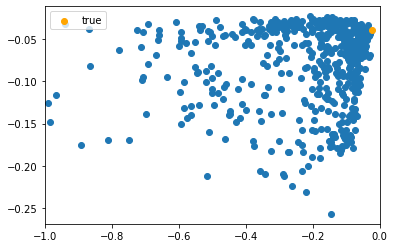

In [211]:
# Expectedly, space of training data after BO training should cover the neighborhood of true param simulation's discrepancy point (the orange point)
real_dis = minus_simluated_discrepancy(theta=([real_theta[0], real_theta[1]], real_theta[2],[real_theta[3],real_theta[4],real_theta[5]], [real_theta[6],real_theta[7]],real_theta[8]), X_response=real_response)
plt.scatter(train_Y[:,0],train_Y[:,1])
plt.scatter(real_dis[0][0],real_dis[0][1],color='orange',label='true')
plt.xlim(-1,0)
plt.legend(loc=2)
plt.show()

In [27]:
# The trained GP model
# import pickle
# gp = pickle.load(open('experiment results/mobolfi_gp_1000iter.sav', 'rb'))

In [212]:
# The real parameter we target
real_theta_u = [real_theta[0],real_theta[3],real_theta[4],real_theta[6],real_theta[7],real_theta[8]]

In [213]:
# Test gp prediction
gp.posterior(torch.Tensor(real_theta_u).view(1,-1)).mean

tensor([[-0.0551, -0.0383]], dtype=torch.float64, grad_fn=<TransposeBackward0>)

In [214]:
gp.posterior(train_X[-1,:].view(1,-1)).mean

tensor([[-0.4987, -0.0339]], dtype=torch.float64, grad_fn=<TransposeBackward0>)

In [215]:
# Store gp prediction and likelihood
# Note that the botorchlikelihood here is not the ABC approximate likelihood illustarted in paper, this likelihood is maximized to infer predictive distribution
# No noise of data points involved here  
training_results = np.zeros((train_Y.size()[0], 6))

for i in range(train_Y.size()[0]):
    real_obj = train_Y[i,:]
    pred_obj = gp.posterior(train_X[i,:].view(1,-1)).mean
    pred_var = gp.posterior(train_X[i,:].view(1,-1)).variance
    botorchlikelihood1 = torch.distributions.Normal(loc=pred_obj[0][0], scale=pred_var[0][0]).log_prob(real_obj[0])
    botorchlikelihood2 = torch.distributions.Normal(loc=pred_obj[0][1], scale=pred_var[0][1]).log_prob(real_obj[1])
    botorchlikelihood = botorchlikelihood1+botorchlikelihood2
    training_results[i,:] = [i,real_obj[0].item(),real_obj[1].item(),pred_obj[0][0].item(),pred_obj[0][1].item(),botorchlikelihood.item()]

training_results

array([[ 0.00000000e+00, -1.10659037e-01, -1.16666667e-01,
        -1.10897651e-01, -1.09748040e-01, -3.60763199e+04],
       [ 1.00000000e+00, -4.63276098e-01, -1.67708333e-01,
        -4.64642675e-01, -1.67013759e-01, -2.36292483e+02],
       [ 2.00000000e+00, -5.76456436e-01, -1.42916667e-01,
        -5.76271179e-01, -1.44126684e-01, -3.15437494e+02],
       ...,
       [ 5.98000000e+02, -2.46782576e+00, -6.85416670e-02,
        -2.46600905e+00, -7.41811313e-02, -3.68861639e+03],
       [ 5.99000000e+02, -2.70143991e-01, -9.04166670e-02,
        -2.67912762e-01, -9.23843068e-02, -7.75025870e+02],
       [ 6.00000000e+02, -5.40850057e-01, -3.50000000e-02,
        -4.98710938e-01, -3.38908169e-02, -2.90666245e+03]])

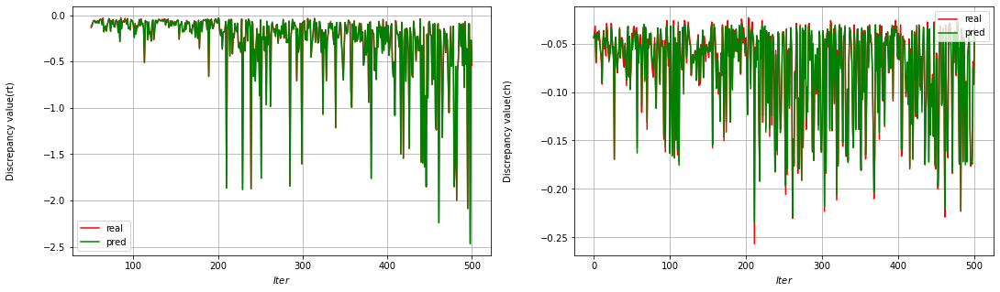

In [216]:
# Draw training curves
# Two curves should almost match together, menaing accurate prediction
font_size_text = 10
fs=10


fig, axs = plt.subplots(1, 2, figsize=(18,5))
axs[0].plot(training_results[num_init_samples+50:,0]-num_init_samples, training_results[num_init_samples+50:,1], color='red', label='real')
axs[0].plot(training_results[num_init_samples+50:,0]-num_init_samples, training_results[num_init_samples+50:,3],'green',label='pred',)
axs[0].legend(fontsize=fs)
axs[0].grid()
axs[0].tick_params(axis='both', labelsize=fs)
axs[0].set_xlabel(r'$Iter$',fontsize=font_size_text)
axs[0].set_ylabel(r'Discrepancy value(rt)',fontsize=font_size_text,rotation='vertical',labelpad=30)

axs[1].plot(training_results[num_init_samples:,0]-num_init_samples, training_results[num_init_samples:,2], color='red', label='real')
axs[1].plot(training_results[num_init_samples:,0]-num_init_samples, training_results[num_init_samples:,4],'green',label='pred')
axs[1].legend(loc=1,fontsize=fs)
axs[1].grid()
axs[1].tick_params(axis='both', labelsize=fs)
axs[1].set_xlabel(r'$Iter$',fontsize=font_size_text)
axs[1].set_ylabel(r'Discrepancy value(ch)',fontsize=font_size_text,rotation='vertical',labelpad=30)


plt.show()

In [217]:
# Estimate covaraince of noise term by simulating with input the latest candidate
Y_cov = np.zeros((200,number_of_discrepancies))
index = np.argmax(training_results[:,-1])
X_cov = train_X[index,:].flatten().numpy()
for i in range(200):
    Y_cov[i,:] = minus_simluated_discrepancy(theta = ([X_cov[0], real_theta[1]], real_theta[2],[X_cov[1],X_cov[2],real_theta[5]],
                                                    [X_cov[3],X_cov[4]], X_cov[-1]))

cov_est_noise = np.cov(Y_cov, rowvar = False)

In [218]:
cov_est_noise

array([[ 4.87534961e-05, -6.33969818e-06],
       [-6.33969818e-06,  2.85922571e-05]])

In [197]:
# Optinal: estimate the correlation between output dimensions (rt and ch)
# Estimate the correlation separately by applying covariance formula ot train_Y
cov_est_output = np.cov(train_Y, rowvar = False)
cov_est_output

array([[0.19027832, 0.00448366],
       [0.00448366, 0.00238846]])

As iteration goes, it is clear to see the predictive discrepancies values are decreasing and gradually clsoe to real_dis, which is expected to see in theory (consistency).

But a good surrogate is not our ultimate target, we want "good" params that attain high likelihood values, and generate high similarity data, i.e. discrepancies very small.

So, the next step is to infer params and test their performance.

**Parameter inference**

We define the approximate posterior function first, and draw MCMC sample parameters from the approximate posterior distribution.


In [47]:
# # We leave the training results on github to construct approxiamte likelihood
# cov_est_noise = np.loadtxt('experiment results/mobolfi_1000iter_cov_est_noise.txt', dtype=np.dtype('float64'))
# cov_est_noise

# tol = np.loadtxt('experiment results/mobolfi_1000iter_10quantiletol.txt', dtype=np.dtype('float64'))
# tol = tol.reshape(-1).tolist()
# tol

[-0.061922167192562, -0.033541666666667]

In [219]:
# The approximate likelihood is viewed as approximate posterior now,
# theta : (1*number_of_parameters) parameter point
# The likelihood approximate here is approximating p(y_obs|theta)

tol = torch.quantile(train_Y,q=0.99,dim=0).tolist()# Test affect of quantile tol level on inference, change the value of q here to see the affect of tolerance
print(tol)

from scipy.stats import multivariate_normal

def approximate_log_likelihood(theta,tol=tol,cov_noise=cov_est_noise,gp=gp,covariance=0):
  theta = theta.view(1,-1)
  preds = gp.posterior(theta)
  means, variances = preds.mean, preds.variance
  means = means.view(-1).detach().numpy() * -1
  Sigma = np.array([[variances[0][0].item(),covariance],
                    [covariance,variances[0][1].item()]])
  cov_matrix = cov_noise + Sigma
  mulnorm = multivariate_normal(mean=means, cov=cov_matrix)
  log_likelihood = torch.Tensor([mulnorm.logcdf([-tol[0],-tol[1]])]).reshape(-1)
  return log_likelihood



[-0.033498834, -0.02625]


In [220]:
approximate_log_likelihood(theta=train_X[-1,:].view(-1)) #Input is defined to be 1d tensor theta, which satisfies need of MCMC package

tensor([-145.0156])

In [221]:
approximate_log_likelihood(theta=torch.Tensor(real_theta_u).view(-1)) # should be large and larger than value of the chunk above

tensor([-8.8125])

In [222]:
real_theta_u 

[0.1, -22, -5, 3, 1.5, 4.59511985013459]

In [223]:
# Calculate the approximate likelihood for all the training data points
lls = np.zeros(train_X.size()[0])
for i in range(train_X.size()[0]):
    param = train_X[i,:].view(-1)
    lls[i] = approximate_log_likelihood(param)

df_describe = pd.DataFrame(lls)
prior_median = df_describe.median()
df_describe.describe()

,0
count,600.000000
mean,-inf
std,NaN
min,-inf
25%,-354.248528
50%,-122.654598
75%,-34.267552
max,-6.489066


The prior density is defined to be product of each marginal priors (assume parameters are indep).

In [224]:
def log_prior(theta):# theta is 1d tensor

    for i in range(theta.size()[0]):
        if theta[i]<=lows_u[i] or theta[i]>=highs_u[i]:
            return torch.Tensor([-1e12])[0]
    
    lp_log_lambda0 = torch.distributions.Uniform(low=lows_u[0], high=highs_u[0]).log_prob(theta[0])
    # lp_log_lambda1 = torch.distributions.Uniform(low=lows[1], high=highs[1]).log_prob(theta[1])
    # lp_log_I0 = torch.distributions.Uniform(low=lows[0], high=highs[0]).log_prob(theta[0])
    lp_beta1 = torch.distributions.Uniform(low=lows_u[1], high=highs_u[1]).log_prob(theta[1])
    lp_beta2 = torch.distributions.Uniform(low=lows_u[2], high=highs_u[2]).log_prob(theta[2])
    # lp_beta3 = torch.distributions.Uniform(low=lows[3], high=highs[3]).log_prob(theta[3])
    # delta1 = 0
    lp_delta2 = torch.distributions.Uniform(low=lows_u[3], high=highs_u[3]).log_prob(theta[3])
    lp_delta3 = torch.distributions.Uniform(low=lows_u[4], high=highs_u[4]).log_prob(theta[4])
    lp_log_threshold_A = torch.distributions.Uniform(low=lows_u[5], high=highs_u[5]).log_prob(theta[5])

    lp = (lp_log_lambda0+lp_beta1+lp_beta2+lp_delta2+lp_delta3+lp_log_threshold_A)
    
    
    return lp

In [225]:
log_prior(theta=train_X[-2,:].view(-1))

tensor(-9.7041)

In [226]:
log_prior(torch.tensor([item-0.5 for item in real_theta_u]).view(-1))

tensor(-1.0000e+12)

In [227]:
#Test prior
priors = np.zeros(train_X.size()[0])
for i in range(train_X.size()[0]):
    param = train_X[i,:].view(-1)
    priors[i] = log_prior(param)

df_describe = pd.DataFrame(priors)
prior_median = df_describe.median()
df_describe.describe()


,0
count,6.010000e+02
mean,-3.510815e+11
std,4.777060e+11
min,-1.000000e+12
25%,-1.000000e+12
50%,-9.704061e+00
75%,-9.704061e+00
max,-9.704061e+00


In [228]:
# Define approximate posterior
def approximate_log_posterior(theta):
  ll = approximate_log_likelihood(theta)
  lprior = log_prior(theta)
  lp = lprior + ll
  return lp

In [229]:
approximate_log_posterior(theta=torch.Tensor(real_theta_u).view(-1))

tensor([-18.5166])

In [213]:
# Marginal approximate likelihood of ch / rt data source
tol = torch.quantile(train_Y,q=0.95,dim=0).tolist()# Test quantile tol level vs marginal posterior, approx ll is very sensitive to tol level!
print(tol)

def approximate_log_likelihood_rt(theta,tol=tol,cov_noise=cov_est_noise,gp=gp):
  theta = theta.view(1,-1)
  preds = gp.posterior(theta)
  means, variances = preds.mean, preds.variance
  if torch.isnan(means[0][0]):
      return torch.from_numpy(np.array(-np.Inf).reshape(-1))
  means = means * -1
  item1 = (-tol[0]-means[0][0])/torch.sqrt(variances[0][0]+torch.Tensor(cov_noise)[0][0])
  prob1 = 0.5 * (1 + torch.erf(item1 / torch.sqrt(torch.tensor(2))))
  log_likelihood = torch.log(prob1)
  return log_likelihood

def approximate_log_likelihood_ch(theta,tol=tol,cov_noise=cov_est_noise,gp=gp):
  theta = theta.view(1,-1)
  preds = gp.posterior(theta)
  means, variances = preds.mean, preds.variance
  if torch.isnan(means[0][1]):
      return torch.from_numpy(np.array(-np.Inf).reshape(-1))
  means = means * -1
  item2 = (-tol[1]-means[0][1])/torch.sqrt(variances[0][1]+torch.Tensor(cov_noise)[1][1])
  prob2 = 0.5 * (1 + torch.erf(item2 / torch.sqrt(torch.tensor(2))))
  log_likelihood = torch.log(prob2)
  return log_likelihood

[-0.04330670632783588, -0.032083333333333325]


In [909]:
print(approximate_log_likelihood_rt(theta=train_X[-1,:].view(-1))) #Input is defined to be 1d tensor theta, which satisfies need of MCMC package
print(approximate_log_likelihood_rt(theta=torch.Tensor(real_theta_u).view(-1))) 

print(approximate_log_likelihood_ch(theta=train_X[-1,:].view(-1))) #Input is defined to be 1d tensor theta, which satisfies need of MCMC package
print(approximate_log_likelihood_ch(theta=torch.Tensor(real_theta_u).view(-1))) 


likelihoods_rt = np.zeros(train_X.size()[0])
for i in range(train_X.size()[0]):
    param = train_X[i,:].view(-1)
    likelihoods_rt[i] = approximate_log_likelihood_rt(param)

df_describe = pd.DataFrame(likelihoods_rt)
print(df_describe.describe())

likelihoods_ch = np.zeros(train_X.size()[0])
for i in range(train_X.size()[0]):
    param = train_X[i,:].view(-1)
    likelihoods_ch[i] = approximate_log_likelihood_ch(param)

df_describe = pd.DataFrame(likelihoods_ch)
print(df_describe.describe())


def approximate_log_posterior_rt(theta):
  ll = approximate_log_likelihood_rt(theta)
  lprior = log_prior(theta)
  lp = lprior + ll - prior_median.item()
  return lp

def approximate_log_posterior_ch(theta):
  ll = approximate_log_likelihood_ch(theta)
  lprior = log_prior(theta)
  lp = lprior + ll - prior_median.item()
  return lp

tensor(-inf, dtype=torch.float64, grad_fn=<LogBackward0>)
tensor(-0.0097, dtype=torch.float64, grad_fn=<LogBackward0>)
tensor(-inf, dtype=torch.float64, grad_fn=<LogBackward0>)
tensor(-5.8726, dtype=torch.float64, grad_fn=<LogBackward0>)
                 0
count  1009.000000
mean          -inf
std            NaN
min           -inf
25%            NaN
50%            NaN
75%     -15.786218
max      -0.001938
                 0
count  1009.000000
mean          -inf
std            NaN
min           -inf
25%            NaN
50%     -26.238785
75%      -5.397906
max      -0.547754


We use Differential evolution MCMC (DeMCMC) to draw samples from the approxiamte posterior for inference. This MCMC method is widely sued in learning sequential sampling models (SSMs). We do not require any specific sampling method or inference method. In reproduction, it's up to your choice to use any other inference method.

DeMCMC

In [230]:
import numpy as np
import pandas as pd
from joblib import Parallel, delayed
from scipy.stats import norm

# For convenience, we attach DEMCMC codes here,if you want to use the DEMCMC sampling

class DEMCMC:

    def __init__(self, param_prior, param_hyper, post_fun, post_type,
                 param_num, chain_num, iter_num,
                 burn_in, migrate_rate, gamma, epsilon_b):
        """
        :param param_prior: a list of strings. list length should be the same as param_num.
                        Only two types prior distribution are available now.
                        "norm", for normal distribution prior.
                        "unif", for uniform distribution prior.
        :param param_hyper: a  (param_num,2) array. Entries are float type.
                        X[i,0] is the mean (or lower bound) of norm (uniform) distribution;
                        X[i,1] is the sd (or upper bound) of the norm (uniform) distribution;

        :param post_fun: a python function for posterior calculation

        :param post_type: bool type
                    post_type = 0, if the posterior returns from 0 to 1.
                    post_type = 1, if the posterior returns log-value.
        :param post_module: string
                    name of module contains the posterior function
        :param param_num: int type.
                    The number of estimable parameters. parameters with known fixed number were included.
        :param chain_num: int type.
                    The number of chains. When n<6,the chain_num = 24; otherwise, chain_num = 3*param_num.
        :param iter_num: int type.
                    The number of iteration.
        :param burn_in: int type.
                    The number of iteration for burn-in period. This part will discard for posterior sampling.
                    Moreover, migration step happens during burn-in period to facilitate convergence
        :param migrate_rate: float type. range from 0 to 1
                    The rate of migration step frequency during burn-in period.
        :param gamma: float type. A hyperparameter of De-MCMC crossover step. gamma = 2.38/sqrt(2*param_num)
        :param epsilon_b: float type. A hyperparameter of De-MCMC crossover step. epsilon \sim uniform[-epsilon_b,epsilon_b]
        """

        self.param_num = param_num
        self.chain_num = chain_num
        self.iter_num = iter_num
        self.burn_in = burn_in
        self.migrate_rate = migrate_rate
        self.gamma = gamma
        self.epsilon_b = epsilon_b
        self.param_prior = param_prior
        self.param_hyper = param_hyper
        self.postfun = post_fun
        self.post_type = post_type


    def log_poster(self, theta):
        """
        :param theta: a list. input of posterior function
        :return: float type. the log-posterior for the dataset given input theta
        """
        if self.post_type:
            # log-posterior is directly used.
            res = self.postfun(theta)
            if np.isnan(res):
                res = -np.inf
                print("Warning: A log-posterior input is NaN. The system will drop it.")
            elif res < -1e12:
                res = -np.inf
                print("The log-posterior input is less than -1e12.")
        else:
            # log-posterior is calculated.
            if np.isnan(self.postfun):
                print("Warning: A posterior input is NaN. The system will drop it.")
                res = -np.inf
            elif self.postfun < 1e-16:
                print("The posterior input is less than 1e-16.")
                res = -np.inf
            else:
                res = np.log(self.postfun(theta))

        return res

    def draw_prior(self, num, prior, hyper):
        '''
        return the random draw from prior
        :param num: int type. the number of random samples.
        :param prior: a string,either "norm" or "unif"
        :param hyper: array(1,2).
                    hyper[0] = mean of norm distribution (or lower bound of uniform);
                    hyper[1] = sd of norm distribution (or upper bound of uniform);
        :return: an array (num,1).
        '''
        if prior == "norm":
            res = np.random.normal(loc=hyper[0], scale=hyper[1], size=num)
        elif prior == "unif":
            res = np.random.uniform(low=hyper[0], high=hyper[1], size=num)
        else:
            print("error: the prior shape is unkown.")
            res = np.nan

        return res


    def initial_chains(self):
        """
        A function to return  for initial value
          :return: a list, whose first and only element is a (chain_num, param_num) matrix
        """
        # Initialize chains. The last column is for likelihood

        chain_list = []
        # check input
        if (len(self.param_prior) != self.param_num) | (np.shape(self.param_hyper)[0] != self.param_num):
            print("error: The parameter prior or hyper input length is inconsistent with parameter number.")
        elif np.shape(self.param_hyper)[1] != 2:
            print("error: The dimension of hyperparameters are inconsistent with design, ",
                  "please check `inital_chains` function for details.")
        else:
            theta_0 = np.zeros((self.chain_num, self.param_num + 1))

            for i in range(self.param_num):
                theta_0[:, i] = self.draw_prior(self.chain_num, self.param_prior[i], self.param_hyper[i, :]).tolist()
            # calculate the log-posterior for chain_num parameter sets
            theta_0[:, self.param_num] = np.apply_along_axis(lambda x: self.log_poster(x[:-1]), 1, theta_0).reshape(self.chain_num, )
            # make sure all initial value has a valid posterior.
            index_p = np.where(np.isinf(theta_0[:, self.param_num]), range(self.chain_num), [-1]*self.chain_num)
            index = []
            for j in index_p:
                if j>=0:
                    index.append(j)

            while len(index) > 0:
                for i in range(self.param_num):
                    theta_0[index, i] = self.draw_prior(len(index), self.param_prior[i], self.param_hyper[i, :]).tolist()
                theta_0[index, self.param_num] = np.apply_along_axis(lambda x: self.log_poster(x[:-1]), 1,
                                                                theta_0[index]).reshape(len(index), )
                index_p = np.where(np.isinf(theta_0[:, self.param_num]), range(self.chain_num), [-1]*self.chain_num)
                index = []
                for j in index_p:
                    if j >= 0:
                        index.append(j)
            chain_list.append(pd.DataFrame(theta_0))

        return chain_list


    def crossover_step(self, chain_index, last_step_chains):
        """
        For a given chain, randomly draw other two chains to get the difference value, the proposed value = chain_value + difference + epsilon
        :param chain_index: int type. The index of the updated chain at this step
        :param last_step_chains: A dataframe.
        :return: the value of chain of this step.It is a vector whose length is param_num+1.

        """
        # last_step_chains = chain_list[last_step_index]
        # get the previous parameter values in this chain
        theta_prev = np.array(last_step_chains.iloc[chain_index, :-1])
        # Randomly draw two chain indices from all chains except the current chain
        prob = [1 / (self.chain_num - 1)] * self.chain_num
        prob[chain_index] = 0
        de_ChainIndex = np.random.choice(range(self.chain_num), size=2, replace=False, p=prob)

        theta_m = np.array(last_step_chains.iloc[de_ChainIndex[0], :-1])
        theta_n = np.array(last_step_chains.iloc[de_ChainIndex[1], :-1])

        # Generate new theta; here, there are npar parameters to estimate in total
        epsilon = np.random.uniform(-self.epsilon_b, self.epsilon_b, self.param_num)
        theta_proposed = theta_prev + self.gamma * (theta_m - theta_n) + epsilon

        proposed_post = self.log_poster(theta_proposed)
        if np.isnan(proposed_post):  # avoid nan.
            proposed_post = -np.inf
        prev_post = last_step_chains.iloc[chain_index, self.param_num]

        # Acceptance rate
        alpha = np.random.uniform()
        ratio = proposed_post - prev_post
        if np.isnan(ratio):
            print("Warning: please check the initial matrix.")
            ratio = -1
        elif np.isinf(ratio) | (ratio <= -1e12):
            ratio = -1
        else:
            ratio = np.exp(ratio)
        if alpha > ratio:
            # reject the proposed value
            temp = np.append(theta_prev, prev_post)

        else:
            temp = np.append(theta_proposed, proposed_post)

        return temp



    def migration_step(self, last_step_chains):

        """
        migration step is optional for De-MCMC, but very useful for the convergence.
        Normally, every 10 or 5 crossover steps during the burn-in stage, one migration step can be used.
        :param last_step_chains: A chain_num by (param_num +1) Dataframe.
         :return: A Dataframe, whose dimension is chain_num by (param_num +1). The last column is log-posterior value.
        """
        temp = last_step_chains
        # select the migration scale, from 2 to chain_num
        mig_num = np.random.randint(low=1, high=self.chain_num)+1
        # randomly draw mig_num chains for migration.
        mig_index = np.random.choice(range(self.chain_num), size=mig_num, replace=False)

        prev_theta = np.array(temp.iloc[mig_index, :-1])
        prev_post = temp.iloc[mig_index, -1].tolist()
        epsilon = np.random.uniform(low=-self.epsilon_b, high=self.epsilon_b, size=(mig_num, self.param_num))

        for i in range(mig_num):
            if i != (mig_num - 1):  # not the last item
                proposed_theta = prev_theta[(i + 1), :] + epsilon[i, :]
            else:
                proposed_theta = prev_theta[0, :] + epsilon[i, :]

            proposed_post = self.log_poster(proposed_theta)
            if np.isnan(proposed_post):  # aviod nan.
                proposed_post = -np.inf
            # whether to accept
            alpha = np.random.uniform()
            ratio = proposed_post - prev_post[i]
            if np.isnan(ratio):
                print("Warning: please check the initial matrix.")
                ratio = -1
            elif np.isinf(ratio) | (ratio <= -1e12):
                ratio = -1
            else:
                ratio = np.exp(ratio)

            if alpha < ratio:  # accept the proposed value
                temp.iloc[mig_index[i], :] = np.append(proposed_theta, proposed_post)
            else:
                temp.iloc[mig_index[i], :] = np.append(prev_theta[i, :], prev_post[i])

        return temp

    def De_MCMC(self) -> list:
        """
        This functions to for De-MCMC sampling to return a chain trace list.
       :return: A list with (iter_num+1) elements, each element is a Dataframe has chain_num rows and param_num+1 columns.
        """
        # initial chain_list
        chain_list = self.initial_chains()
        # chain_list = [init2]
        print("initialization is finished.")

        chain_add = chain_list[0]
        chain_add1 = chain_add
        for i in range(self.iter_num):
            chain_add = pd.DataFrame(Parallel(n_jobs=-3)(delayed(self.crossover_step)(row, chain_add) for row in range(self.chain_num)))
            # for j in range(self.chain_num):
            #     chain_add1.iloc[j, :] = self.crossover_step(chain_index=j, last_step_chains=chain_add)
            # chain_add = chain_add1

            if i%50 == 0:
                print(i, "iterations has been done.")
            chain_list.append(chain_add)
            if (i <= self.burn_in) & (np.random.uniform() < self.migrate_rate):
                # conduct migrate step
                chain_add = self.migration_step(chain_add)
                chain_list[i + 1] = chain_add
        return chain_list

In [231]:
# DEMCMC sampling
if __name__ == "__main__":
    param_num = 6 # numerb fo parameters to sample
    chain_num = 9 # number of chains
    iter_num = 16000 # size of samples in each chain
    burn_in = 13000 # burn in size
    migrate_rate = 0.5
    gamma = 2.38 / np.sqrt(2 * param_num)  # suggested value
    epsilon_b = 1e-4
    param_prior = ["unif", "unif", "unif", "unif", "unif", "unif"]
    param_hyper = np.array([[lows_u[0], highs_u[0]], [lows_u[1], highs_u[1]],[lows_u[2], highs_u[2]], [lows_u[3], highs_u[3]], [lows_u[4], highs_u[4]],
                            [lows_u[5]+0.1, highs_u[5]-0.1]])
    
    # convert tensor to decimals for compatibility
    def myll(theta):
        theta = torch.tensor(theta).view(-1)
        ll = approximate_log_posterior(theta) #approximate_log_posterior_ch/approximate_log_posterior_rt
        return ll.item()

    test_list = DEMCMC(param_prior=param_prior, param_hyper=param_hyper,
                  post_fun=myll, post_type=1,
                  chain_num=chain_num, param_num=param_num, iter_num=iter_num,
                  burn_in=burn_in, migrate_rate=migrate_rate, gamma=gamma, epsilon_b=epsilon_b)

    demcmc_sample_list = test_list.De_MCMC()
    
    print(demcmc_sample_list)

initialization is finished.
0 iterations has been done.
50 iterations has been done.
100 iterations has been done.
150 iterations has been done.
200 iterations has been done.
250 iterations has been done.
300 iterations has been done.
350 iterations has been done.
400 iterations has been done.
450 iterations has been done.
500 iterations has been done.
550 iterations has been done.
600 iterations has been done.
650 iterations has been done.
700 iterations has been done.
750 iterations has been done.
800 iterations has been done.
850 iterations has been done.
900 iterations has been done.
950 iterations has been done.
1000 iterations has been done.
1050 iterations has been done.
1100 iterations has been done.
1150 iterations has been done.
1200 iterations has been done.
1250 iterations has been done.
1300 iterations has been done.
1350 iterations has been done.
1400 iterations has been done.
1450 iterations has been done.
1500 iterations has been done.
1550 iterations has been done.
160

In [232]:
# for each demcmc sampling list, flatten over chains for further visualization
# Note we can change the number of iterations for GP training and level of tolerance quantile
# For different approximate lieklihood function, we name flattened demcmc samples corresposndingly
# For instance, below coords_demcmc_500iter denotes the approximate posterior conditional on both data sources with GP trained 500 iters
# If not announced GP is trained with 1000 iters, tolerance is set to be 1% quantile of the total training dataset after BO training.

coords_demcmc = np.zeros((1, num_of_parameters))

for i in range(burn_in,len(demcmc_sample_list)-1):
    sample = demcmc_sample_list[i].iloc[:,:-1]
    coords_demcmc = np.concatenate((coords_demcmc,sample),axis=0)


# coords_demcmc_500iter = np.zeros((1, num_of_parameters))

# for i in range(burn_in,len(demcmc_sample_list)-1):
#     sample = demcmc_sample_list[i].iloc[:,:-1]
#     coords_demcmc_500iter = np.concatenate((coords_demcmc_500iter,sample),axis=0)

The MLBA model, including its original version and its variants in this decade, offers a closed form likelihood function. We leave the closed form likelihood function in supplementary of the paper, and an attached code to calculate the closed form likelihood value in github. This function can be viewed as the baseline of the likelihood-free inference method.
Note that closed form likelihood function is not the strictly defined real likelihood of MLBA model. MLBA model has many variants that modify its simualtion procedure, but all these variants, at least in the field of psychology research, solely treat the closed form likelihood as the state-of-the-art in analysis, mainly because the main structure of MLAB models are samely following the LBA paper *[Scott et al, 2008](https://www.sciencedirect.com/science/article/abs/pii/S0010028507000722)*. Sampling from this closed form likelihood is not always stable and converging to the true parameter. We leave the analysis of performance of the closed form likelihood function for future work, but here provide it as one of the baseline (another iss the true value of real parameters) to show the power of MOBOLFI.

In [28]:
import MLBA_prob

In [148]:
# demcmc sample for MLBA clsoed form likelihood
param_num = 6
chain_num = 9
iter_num = 20000
burn_in = 18000
migrate_rate = 0.5
gamma = 2.38 / np.sqrt(2 * param_num) 
epsilon_bs = 1e-3
param_prior = ["unif", "unif", "unif", "unif", "unif", "unif"]
param_hyper = np.array([[lows_u[0], highs_u[0]], [lows_u[1], highs_u[1]],[lows_u[2], highs_u[2]], [lows_u[3], highs_u[3]], [lows_u[4], highs_u[4]],
                            [lows_u[5], highs_u[5]]])


def mlba_true_posterior(theta):
    mean_drift_rates = compute_mean_drift_rate(X_attributes,lambdas=[theta[0],real_theta[1]], log_I0=real_theta[2],
                        betas=[theta[1],theta[2],real_theta[5]],deltas=[theta[3],theta[4]])
    real_log_posterior = 0
    for j in range(len(real_data[0])):
            real_log_posterior_onecandidate = np.log(MLBA_prob.pdf_mlba(rc=real_data[1][j], rt=real_data[0][j], 
                   drift=mean_drift_rates[j], b=np.exp(theta[5]) + 1, A=1, s=1))
            real_log_posterior += real_log_posterior_onecandidate
    return real_log_posterior
    
test_list_mlba = DEMCMC(param_prior=param_prior, param_hyper=param_hyper,
                  post_fun=mlba_true_posterior, post_type=1,
                  chain_num=chain_num, param_num=param_num, iter_num=iter_num,
                  burn_in=burn_in, migrate_rate=migrate_rate, gamma=gamma, epsilon_b=epsilon_bs)

demcmc_sample_list_mlba = test_list_mlba.De_MCMC()
     
coords_demcmc_mlbathetas = np.zeros((1, num_of_parameters))

for i in range(burn_in,len(demcmc_sample_list_mlba)-1):
    sample = demcmc_sample_list_mlba[i].iloc[:,:-1]
    coords_demcmc_mlbathetas = np.concatenate((coords_demcmc_mlbathetas,sample),axis=0)


C:\Users\64829\AppData\Local\Temp\ipykernel_33232\124569910.py:20: RuntimeWarning: divide by zero encountered in log
  real_log_posterior_onecandidate = np.log(MLBA_prob.pdf_mlba(rc=real_data[1][j], rt=real_data[0][j],


The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.


C:\Users\64829\AppData\Local\Temp\ipykernel_33232\124569910.py:20: RuntimeWarning: invalid value encountered in log
  real_log_posterior_onecandidate = np.log(MLBA_prob.pdf_mlba(rc=real_data[1][j], rt=real_data[0][j],


The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less than -1e12.
The log-posterior input is less 

C:\Users\64829\AppData\Local\Temp\ipykernel_33232\871863013.py:232: RuntimeWarning: overflow encountered in exp
  ratio = np.exp(ratio)


50 iterations has been done.
100 iterations has been done.
150 iterations has been done.
200 iterations has been done.
250 iterations has been done.
300 iterations has been done.
350 iterations has been done.
400 iterations has been done.
450 iterations has been done.
500 iterations has been done.
550 iterations has been done.
600 iterations has been done.
650 iterations has been done.
700 iterations has been done.
750 iterations has been done.
800 iterations has been done.
850 iterations has been done.
900 iterations has been done.
950 iterations has been done.
1000 iterations has been done.
1050 iterations has been done.
1100 iterations has been done.
1150 iterations has been done.
1200 iterations has been done.
1250 iterations has been done.
1300 iterations has been done.
1350 iterations has been done.
1400 iterations has been done.
1450 iterations has been done.
1500 iterations has been done.
1550 iterations has been done.
1600 iterations has been done.
1650 iterations has been don

In [157]:
# Multiple chains plot for clsoed form likelihood samples
# Chains should mix together
chain_num=9
iter_num=16000
burn_in=13000
# All Chains
coords_demcmc_all_chains = np.zeros((chain_num, iter_num-burn_in+1, num_of_parameters))

index_chain = 0
for j in range(1,len(coords_demcmc)):
    sample_onechain = coords_demcmc[j,:] 
    coords_demcmc_all_chains[index_chain,(j-1)//chain_num,:] = sample_onechain
    index_chain+=1
    if index_chain == 9:
        index_chain = 0

In [ ]:
# # Multiple chains plot for clsoed form likelihood samples
# # Chains should mix together
# chain_num=9
# iter_num=16000
# burn_in=13000
# # All Chains
# coords_demcmc_all_chains_500iter = np.zeros((chain_num, iter_num-burn_in+1, num_of_parameters))

# index_chain = 0
# for j in range(1,len(coords_demcmc)):
#     sample_onechain = coords_demcmc[j,:] 
#     coords_demcmc_all_chains_500iter[index_chain,(j-1)//chain_num,:] = sample_onechain
#     index_chain+=1
#     if index_chain == 9:
#         index_chain = 0

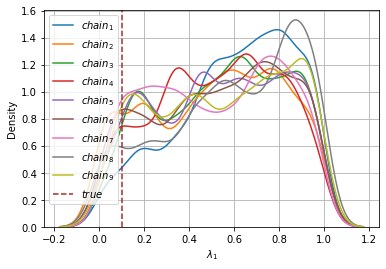

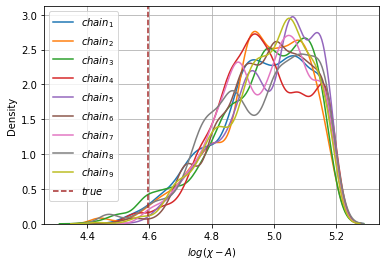

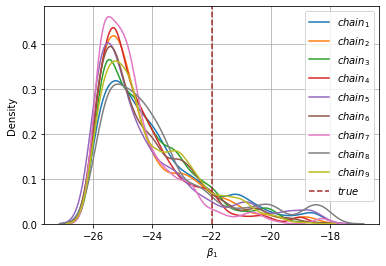

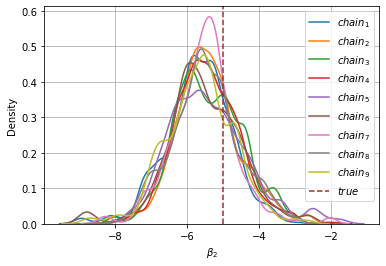

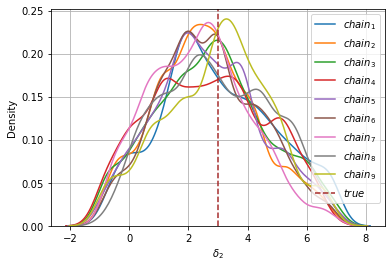

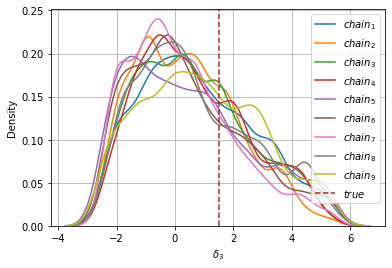

In [158]:
# Multiple chains demcmc, chians of demcmc are expectedly match up almost together to some extent
import seaborn as sns
font_size_text = 10
fs=10
param_list = ['$\lambda_1$','$log (\chi-A)$',r'$\beta_1$',r'$\beta_2$','$\delta_2$','$\delta_3$']
chain_list = ['$chain_1$','$chain_2$','$chain_3$','$chain_4$','$chain_5$','$chain_6$','$chain_7$','$chain_8$','$chain_9$']
mobolfi_llk_index = [0,5,1,2,3,4]


for i in range(num_of_parameters):
    for j in range(chain_num):
        sns.kdeplot(coords_demcmc_all_chains_500iter[j][:-1,mobolfi_llk_index[i]], label=chain_list[j],bw_adjust=1)
    plt.axvline(real_theta_u[mobolfi_llk_index[i]],0,1,linestyle="--",c='brown',label='$true$')
    plt.legend(fontsize=fs)
    plt.grid()
    plt.tick_params(axis='both', labelsize=fs)
    plt.xlabel(param_list[i],fontsize=font_size_text)
    plt.show()


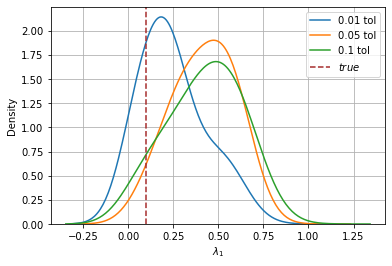

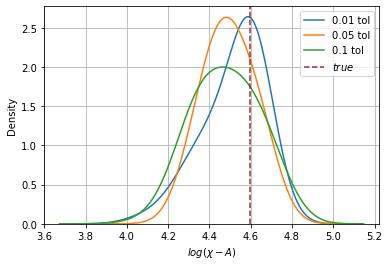

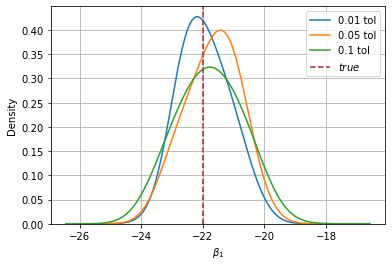

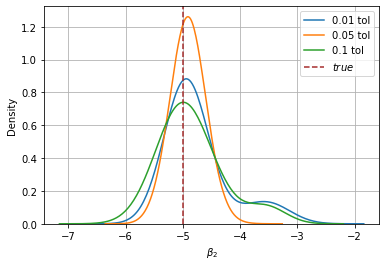

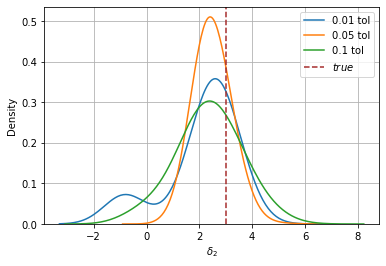

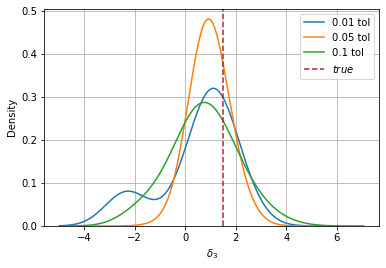

In [854]:
# Compare MOBOLFI approximation given different values of tolerance (0.01, 0.05 and 0.1 quanitle of training data, 0.05 quantile is the recommendaed choice from BOLFI paper)

font_size_text = 10
fs=10
for i in range(num_of_parameters):
    sns.kdeplot(coords_demcmc[1:,mobolfi_llk_index[i]], label='0.01 tol',bw_adjust=5)
    sns.kdeplot(coords_demcmc_5tol[1:,mobolfi_llk_index[i]], label='0.05 tol',bw_adjust=5)
    sns.kdeplot(coords_demcmc_10tol[1:,mobolfi_llk_index[i]], label='0.1 tol',bw_adjust=5)
    plt.axvline(real_theta_u[mobolfi_llk_index[i]],0,1,linestyle="--",c='brown',label='$true$')
    plt.legend(fontsize=fs)
    plt.grid()
    plt.tick_params(axis='both', labelsize=fs)
    plt.xlabel(param_list[i],fontsize=font_size_text)
    plt.show()

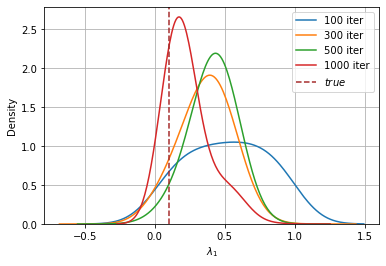

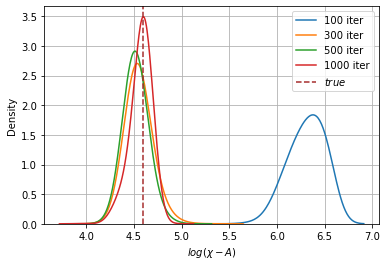

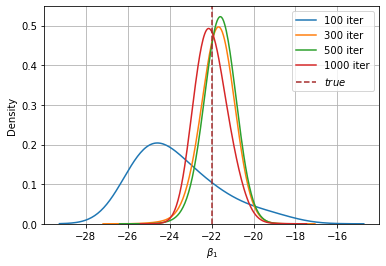

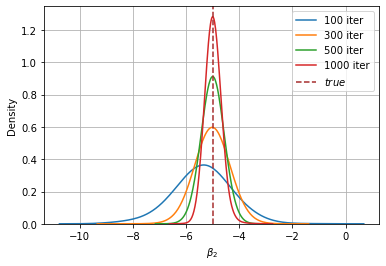

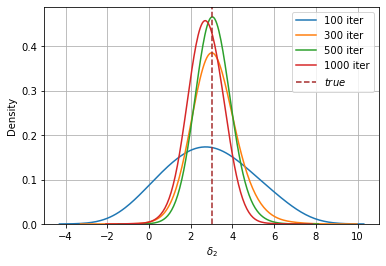

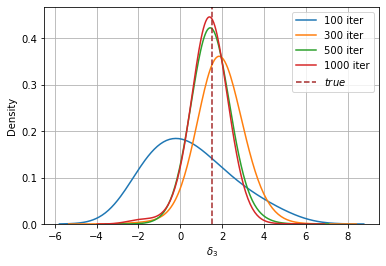

In [244]:
# Compare MOBOLFI approximate llk given different number of iters
import seaborn as sns
param_list = ['$\lambda_1$','$log (\chi-A)$',r'$\beta_1$',r'$\beta_2$','$\delta_2$','$\delta_3$']
mobolfi_llk_index = [0,5,1,2,3,4]
var_list300 = [0.1,0.1,0.5,0.5,0.5,0.5]
var_list = [0.1,0.1,0.5,0.3,0.5,0.5]
for i in range(num_of_parameters):
    sns.kdeplot(coords_demcmc_100iter[1:,mobolfi_llk_index[i]], label='100 iter',bw_adjust=5)
    sns.kdeplot(coords_demcmc_300iter[1:,mobolfi_llk_index[i]], label='300 iter',bw_adjust=5)
    sns.kdeplot(coords_demcmc_500iter[1:,mobolfi_llk_index[i]], label='500 iter',bw_adjust=5)
    sns.kdeplot(coords_demcmc[1:,mobolfi_llk_index[i]], label='1000 iter',bw_adjust=5)
    plt.axvline(real_theta_u[mobolfi_llk_index[i]],0,1,linestyle="--",c='brown',label='$true$')
    plt.legend(fontsize=fs)
    plt.grid()
    plt.tick_params(axis='both', labelsize=fs)
    plt.xlabel(param_list[i],fontsize=font_size_text)
    plt.show()

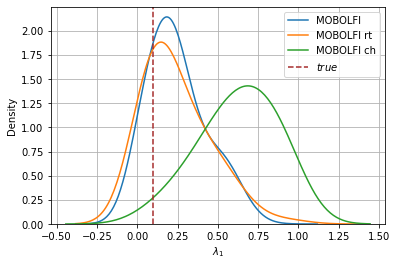

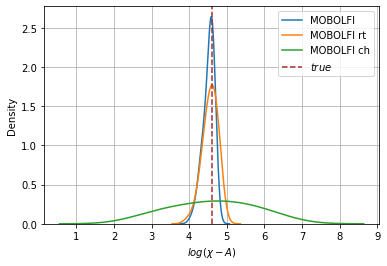

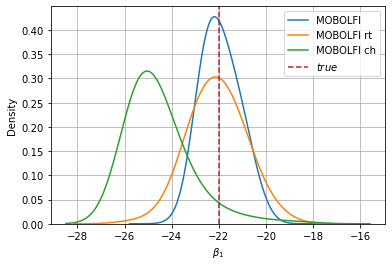

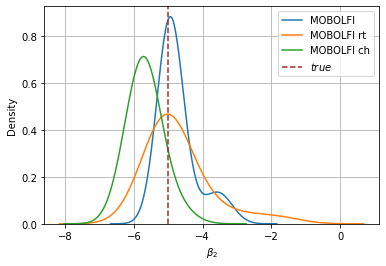

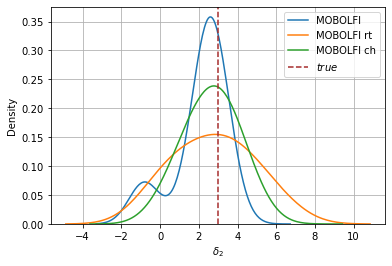

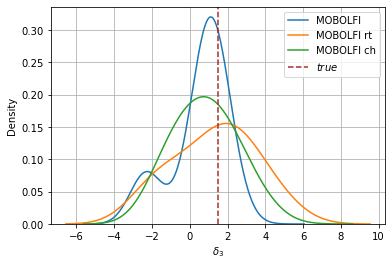

In [916]:
# Compare joint MOBOLFI approximate llk and marginal llk 

font_size_text = 10
fs=10
for i in range(num_of_parameters):
    sns.kdeplot(coords_demcmc[1:,mobolfi_llk_index[i]], label='MOBOLFI',bw_adjust=5)
    sns.kdeplot(coords_demcmc_rt[1:,mobolfi_llk_index[i]], label='MOBOLFI rt',bw_adjust=5)
    sns.kdeplot(coords_demcmc_ch[1:,mobolfi_llk_index[i]], label='MOBOLFI ch',bw_adjust=5)
    plt.axvline(real_theta_u[mobolfi_llk_index[i]],0,1,linestyle="--",c='brown',label='$true$')
    plt.legend(fontsize=fs)
    plt.grid()
    plt.tick_params(axis='both', labelsize=fs)
    plt.xlabel(param_list[i],fontsize=font_size_text)
    plt.show()

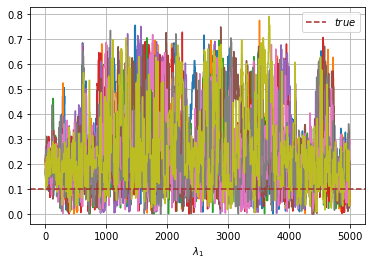

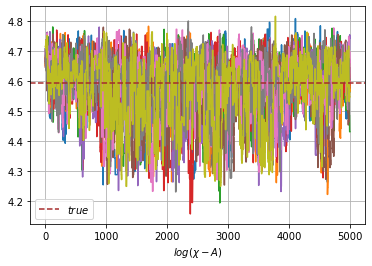

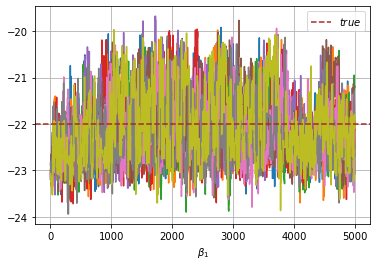

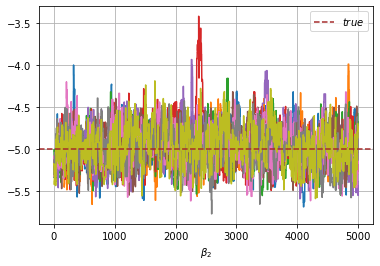

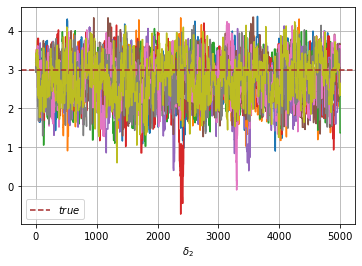

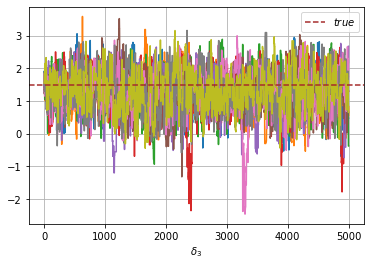

In [81]:
# Diagnostics
# Trace plots
for i in range(num_of_parameters):
    for j in range(chain_num):
        plt.plot(list(range(1,coords_demcmc_all_chains[j].shape[0])),coords_demcmc_all_chains[j][:-1,mobolfi_llk_index[i]])
    plt.axhline(real_theta_u[mobolfi_llk_index[i]],0,1,linestyle="--",c='brown',label='$true$')
    plt.legend(fontsize=fs)
    plt.grid()
    plt.tick_params(axis='both', labelsize=fs)
    plt.xlabel(param_list[i],fontsize=font_size_text)
    plt.show()




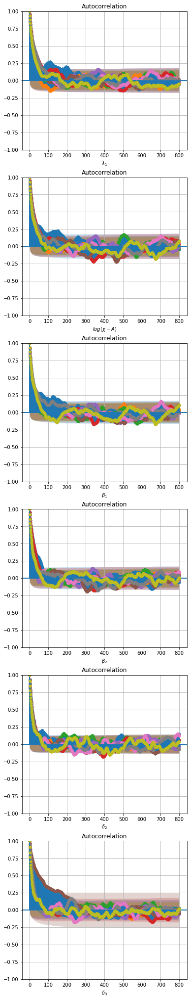

In [788]:
# ACF plots
from statsmodels.graphics.tsaplots import plot_acf

fig, axs = plt.subplots(num_of_parameters, 1, figsize=(6,num_of_parameters*6),sharey=True)

for i in range(num_of_parameters):
    for j in range(chain_num):
        plot_acf(coords_demcmc_all_chains[j][:-1,mobolfi_llk_index[i]], ax=axs[i],lags=800)
    axs[i].grid()
    axs[i].tick_params(axis='both', labelsize=fs)
    axs[i].set_xlabel(param_list[i],fontsize=font_size_text)

plt.show()